In [25]:
from mmengine.utils import get_git_hash
from mmengine.utils.dl_utils import collect_env as collect_base_env

import mmdet

# 环境信息收集和打印
def collect_env():
    """Collect the information of the running environments."""
    env_info = collect_base_env()
    env_info['MMDetection'] = f'{mmdet.__version__}+{get_git_hash()[:7]}'
    return env_info


if __name__ == '__main__':
    for name, val in collect_env().items():
        print(f'{name}: {val}')

sys.platform: win32
Python: 3.9.16 (main, May 17 2023, 17:49:16) [MSC v.1916 64 bit (AMD64)]
CUDA available: True
numpy_random_seed: 2147483648
GPU 0: NVIDIA GeForce GTX 1050
CUDA_HOME: C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v11.4
NVCC: Cuda compilation tools, release 11.4, V11.4.100
GCC: n/a
PyTorch: 1.12.0+cu113
PyTorch compiling details: PyTorch built with:
  - C++ Version: 199711
  - MSVC 192829337
  - Intel(R) Math Kernel Library Version 2020.0.2 Product Build 20200624 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.6.0 (Git Hash 52b5f107dd9cf10910aaa19cb47f3abf9b349815)
  - OpenMP 2019
  - LAPACK is enabled (usually provided by MKL)
  - CPU capability usage: AVX2
  - CUDA Runtime 11.3
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_61,code=sm_61;-gencode;arch=compute_70,code=sm_70;-gencode;arch=compute_75,code=sm_75;-gencode;arch=compute_80,

In [29]:
import os
os.chdir(r"E:\openmmlab\third\mmdetection")
os.getcwd()

'E:\\openmmlab\\third\\mmdetection'

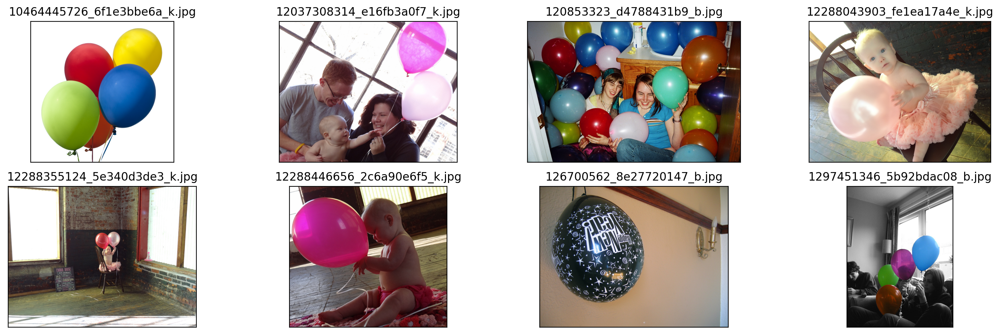

In [30]:
# 数据集可视化

import os
import matplotlib.pyplot as plt
from PIL import Image

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

image_paths= [filename for filename in os.listdir('data/balloon/train')][:8]

for i,filename in enumerate(image_paths):
    name = os.path.splitext(filename)[0]

    image = Image.open('data/balloon/train/'+filename).convert("RGB")
  
    plt.subplot(2, 4, i+1)
    plt.imshow(image)
    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

我们也提供了 coco json 标注，用户可以直接使用，而无需自己重新标注。COCO Json 可视化如下所示

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


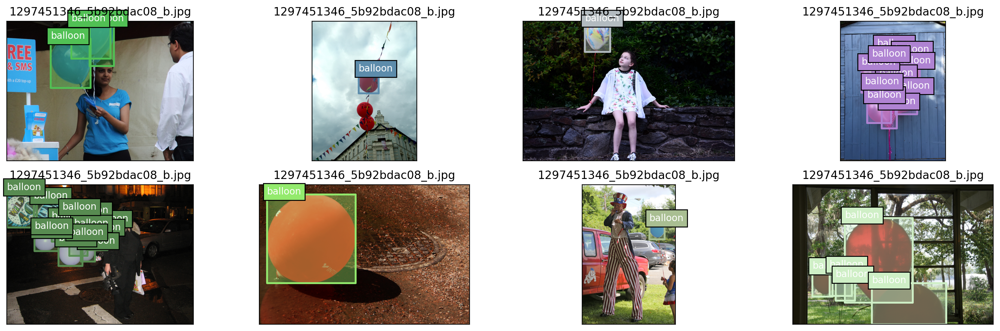

In [31]:
from pycocotools.coco import COCO
import numpy as np
import os.path as osp
from matplotlib.collections import PatchCollection
from matplotlib.patches import Polygon

def apply_exif_orientation(image):
    _EXIF_ORIENT = 274
    if not hasattr(image, 'getexif'):
        return image

    try:
        exif = image.getexif()
    except Exception:
        exif = None

    if exif is None:
        return image

    orientation = exif.get(_EXIF_ORIENT)

    method = {
        2: Image.FLIP_LEFT_RIGHT,
        3: Image.ROTATE_180,
        4: Image.FLIP_TOP_BOTTOM,
        5: Image.TRANSPOSE,
        6: Image.ROTATE_270,
        7: Image.TRANSVERSE,
        8: Image.ROTATE_90,
    }.get(orientation)
    if method is not None:
        return image.transpose(method)
    return image


def show_bbox_only(coco, anns, show_label_bbox=True, is_filling=True):
    """Show bounding box of annotations Only."""
    if len(anns) == 0:
        return

    ax = plt.gca()
    ax.set_autoscale_on(False)

    image2color = dict()
    for cat in coco.getCatIds():
        image2color[cat] = (np.random.random((1, 3)) * 0.7 + 0.3).tolist()[0]

    polygons = []
    colors = []

    for ann in anns:
        color = image2color[ann['category_id']]
        bbox_x, bbox_y, bbox_w, bbox_h = ann['bbox']
        poly = [[bbox_x, bbox_y], [bbox_x, bbox_y + bbox_h],
                [bbox_x + bbox_w, bbox_y + bbox_h], [bbox_x + bbox_w, bbox_y]]
        polygons.append(Polygon(np.array(poly).reshape((4, 2))))
        colors.append(color)

        if show_label_bbox:
            label_bbox = dict(facecolor=color)
        else:
            label_bbox = None

        ax.text(
            bbox_x,
            bbox_y,
            '%s' % (coco.loadCats(ann['category_id'])[0]['name']),
            color='white',
            bbox=label_bbox)

    if is_filling:
        p = PatchCollection(
            polygons, facecolor=colors, linewidths=0, alpha=0.4)
        ax.add_collection(p)
    p = PatchCollection(
        polygons, facecolor='none', edgecolors=colors, linewidths=2)
    ax.add_collection(p)

    
coco = COCO('data/balloon/train.json')
image_ids = coco.getImgIds()
np.random.shuffle(image_ids)

plt.figure(figsize=(16, 5))

# 只可视化 8 张图片
for i in range(8):
    image_data = coco.loadImgs(image_ids[i])[0]
    image_path = osp.join('data/balloon/train/',image_data['file_name'])
    annotation_ids = coco.getAnnIds(
            imgIds=image_data['id'], catIds=[], iscrowd=0)
    annotations = coco.loadAnns(annotation_ids)
    
    ax = plt.subplot(2, 4, i+1)
    image = Image.open(image_path).convert("RGB")
    
    # 这行代码很关键，否则可能图片和标签对不上
    image=apply_exif_orientation(image)
    
    ax.imshow(image)
    
    show_bbox_only(coco, annotations)
    
    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])
        
plt.tight_layout()    

# 2 自定义配置文件

本教程采用 RTMDet 进行演示，在开始自定义配置文件前，先来了解下 RTMDet 算法。

![RTMDet](https://user-images.githubusercontent.com/27466624/225922103-404064c1-3cb0-4ab5-9388-79f9517dcdb0.jpg)

其模型架构图如上所示。RTMDet 是一个高性能低延时的检测算法，目前已经实现了目标检测、实例分割和旋转框检测任务。其简要描述为：**为了获得更高效的模型架构，MMDetection 探索了一种具有骨干和 Neck 兼容容量的架构，由一个基本的构建块构成，其中包含大核深度卷积。MMDetection 进一步在动态标签分配中计算匹配成本时引入软标签，以提高准确性。结合更好的训练技巧，得到的目标检测器名为 RTMDet，在 NVIDIA 3090 GPU 上以超过 300 FPS 的速度实现了 52.8% 的 COCO AP，优于当前主流的工业检测器。RTMDet 在小/中/大/特大型模型尺寸中实现了最佳的参数-准确度权衡，适用于各种应用场景，并在实时实例分割和旋转对象检测方面取得了新的最先进性能。**

|                            | mAP             | Params         | Flops        | Inference speed |
| -------------------------- | --------------- | -------------- | ------------ | --------------- |
| Baseline(YOLOX)            | 40.2            | 9M             | 13.4G        | 1.2ms           |
| + AdamW + Flat Cosine      | 40.6 (+0.4)     | 9M             | 13.4G        | 1.2ms           |
| + CSPNeXt backbone & PAFPN | 41.8 (+1.2)     | 10.07M (+1.07) | 14.8G (+1.4) | 1.22ms (+0.02)  |
| + SepBNHead                | 41.8 (+0)       | 8.89M (-1.18)  | 14.8G        | 1.22ms          |
| + Label Assign & Loss      | 42.9 (+1.1)     | 8.89M          | 14.8G        | 1.22ms          |
| + Cached Mosaic & MixUp    | 44.2 (+1.3)     | 8.89M          | 14.8G        | 1.22ms          |
| + RSB-pretrained backbone  | **44.5 (+0.3)** | 8.89M          | 14.8G        | 1.22ms          |

详情见 [论文](https://arxiv.org/abs/2212.07784)。

cat 是一个单类的数据集，而 MMDetection 中提供的是 COCO 80 类配置，因此我们需要对一些重要参数通过配置来修改。

In [32]:
# 当前路径位于 mmdetection/tutorials, 配置将写到 mmdetection/tutorials 路径下

config_cat = """
_base_ = 'configs/rtmdet/rtmdet_tiny_8xb32-300e_coco.py'

data_root = 'data/balloon/'

metainfo = {
    'classes': ('balloon',),
    'palette': [
        (220, 20, 60),
    ]
}
num_classes = 1


max_epochs = 40

train_batch_size_per_gpu = 12

train_num_workers = 4


val_batch_size_per_gpu = 1
val_num_workers = 2


num_epochs_stage2 = 5

base_lr = 12 * 0.004 / (32*8)

load_from = 'https://download.openmmlab.com/mmdetection/v3.0/rtmdet/rtmdet_tiny_8xb32-300e_coco/rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth'  # noqa

model = dict(
    backbone=dict(frozen_stages=4),
    bbox_head=dict(dict(num_classes=num_classes)))

train_dataloader = dict(
    batch_size=train_batch_size_per_gpu,
    num_workers=train_num_workers,
    pin_memory=False,
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        ann_file='train.json',
        data_prefix=dict(img='train/')))

val_dataloader = dict(
    batch_size=val_batch_size_per_gpu,
    num_workers=val_num_workers,
    dataset=dict(
        metainfo=metainfo,
        data_root=data_root,
        ann_file='val.json',
        data_prefix=dict(img='val/')))

test_dataloader = val_dataloader

param_scheduler = [
    dict(
        type='LinearLR',
        start_factor=1.0e-5,
        by_epoch=False,
        begin=0,
        end=30),
    dict(
        type='CosineAnnealingLR',
        eta_min=base_lr * 0.05,
        begin=max_epochs // 2,  
        end=max_epochs,
        T_max=max_epochs // 2,
        by_epoch=True,
        convert_to_iter_based=True),
]
optim_wrapper = dict(optimizer=dict(lr=base_lr))

_base_.custom_hooks[1].switch_epoch = max_epochs - num_epochs_stage2

val_evaluator = dict(ann_file=data_root + 'val.json')
test_evaluator = val_evaluator

default_hooks = dict(
    checkpoint=dict(interval=10, max_keep_ckpts=2, save_best='auto'), 
    logger=dict(type='LoggerHook', interval=5))
train_cfg = dict(max_epochs=max_epochs, val_interval=10)
"""

with open('rtmdet_tiny_1xb12-40e_balloon.py', 'w') as f:
    f.write(config_cat)

需要注意几个问题：

1. 自定义数据集中最重要的是 metainfo 字段，用户在配置完成后要记得将其传给 dataset，否则不生效(有些用户在自定义数据集时候喜欢去 直接修改 coco.py 源码，这个是强烈不推荐的做法，正确做法是配置 metainfo 并传给 dataset)

2. 如果用户 metainfo 配置不正确，通常会出现几种情况：(1) 出现 num_classes 不匹配错误 (2) loss_bbox 始终为 0 (3) 出现训练后评估结果为空等典型情况

3. MMDetection 提供的学习率大部分都是基于 8 卡，如果你的总 bs 不同，一定要记得缩放学习率，否则有些算法很容易出现 NAN，具体参考 https://mmdetection.readthedocs.io/zh_CN/latest/user_guides/train.html#id3

# 3 训练前可视化验证

我们可以采用 mmdet 提供的 `tools/analysis_tools/browse_dataset.py` 脚本来对训练前的 dataloader 输出进行可视化，确保数据部分没有问题。
考虑到我们仅仅想可视化前几张图片，因此下面基于 browse_dataset.py 实现一个简单版本即可

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
06/11 23:03:34 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.


D:\ProgramData\Anaconda3\envs\mmseg\lib\site-packages\mmengine\visualization\visualizer.py:757: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(
D:\ProgramData\Anaconda3\envs\mmseg\lib\site-packages\mmengine\visualization\visualizer.py:828: UserWarning: Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(


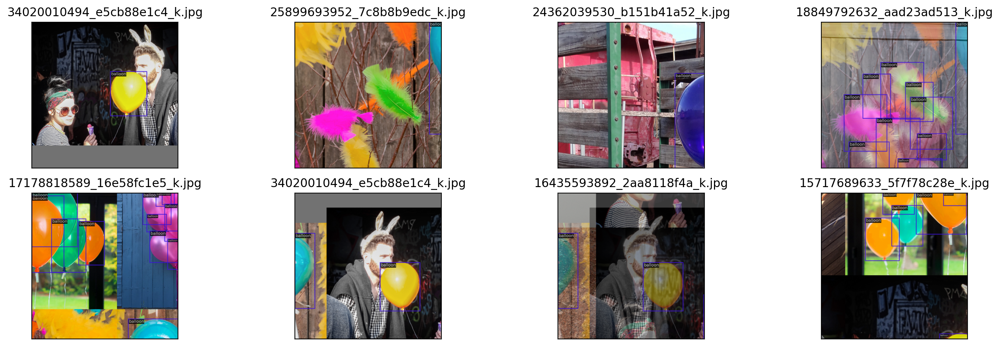

In [33]:
from mmdet.registry import DATASETS, VISUALIZERS
from mmengine.config import Config
from mmengine.registry import init_default_scope

cfg = Config.fromfile('rtmdet_tiny_1xb12-40e_balloon.py')

init_default_scope(cfg.get('default_scope', 'mmdet'))

dataset = DATASETS.build(cfg.train_dataloader.dataset)
visualizer = VISUALIZERS.build(cfg.visualizer)
visualizer.dataset_meta = dataset.metainfo

plt.figure(figsize=(16, 5))

# 只可视化前 8 张图片
for i in range(8):
   item=dataset[i]

   img = item['inputs'].permute(1, 2, 0).numpy()
   data_sample = item['data_samples'].numpy()
   gt_instances = data_sample.gt_instances
   img_path = osp.basename(item['data_samples'].img_path)

   gt_bboxes = gt_instances.get('bboxes', None)
   gt_instances.bboxes = gt_bboxes.tensor
   data_sample.gt_instances = gt_instances

   visualizer.add_datasample(
            osp.basename(img_path),
            img,
            data_sample,
            draw_pred=False,
            show=False)
   drawed_image=visualizer.get_image()

   plt.subplot(2, 4, i+1)
   plt.imshow(drawed_image[..., [2, 1, 0]])
   plt.title(f"{osp.basename(img_path)}")
   plt.xticks([])
   plt.yticks([])

plt.tight_layout()    

# 4 模型训练

在验证数据流本身没有问题后，就可以开始进行训练了

In [2]:
!python tools/train.py rtmdet_tiny_1xb12-40e_balloon.py

06/11 22:31:17 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: win32
    Python: 3.9.16 (main, May 17 2023, 17:49:16) [MSC v.1916 64 bit (AMD64)]
    CUDA available: True
    numpy_random_seed: 1808890086
    GPU 0: NVIDIA GeForce GTX 1050
    CUDA_HOME: C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v11.4
    NVCC: Cuda compilation tools, release 11.4, V11.4.100
    GCC: n/a
    PyTorch: 1.12.0+cu113
    PyTorch compiling details: PyTorch built with:
  - C++ Version: 199711
  - MSVC 192829337
  - Intel(R) Math Kernel Library Version 2020.0.2 Product Build 20200624 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.6.0 (Git Hash 52b5f107dd9cf10910aaa19cb47f3abf9b349815)
  - OpenMP 2019
  - LAPACK is enabled (usually provided by MKL)
  - CPU capability usage: AVX2
  - CUDA Runtime 11.3
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arc

D:\ProgramData\Anaconda3\envs\mmseg\lib\site-packages\torch\functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:2895.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [3]:
!python tools/test.py rtmdet_tiny_1xb12-40e_balloon.py work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_40.pth

06/11 22:38:32 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: win32
    Python: 3.9.16 (main, May 17 2023, 17:49:16) [MSC v.1916 64 bit (AMD64)]
    CUDA available: True
    numpy_random_seed: 1469590773
    GPU 0: NVIDIA GeForce GTX 1050
    CUDA_HOME: C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v11.4
    NVCC: Cuda compilation tools, release 11.4, V11.4.100
    GCC: n/a
    PyTorch: 1.12.0+cu113
    PyTorch compiling details: PyTorch built with:
  - C++ Version: 199711
  - MSVC 192829337
  - Intel(R) Math Kernel Library Version 2020.0.2 Product Build 20200624 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.6.0 (Git Hash 52b5f107dd9cf10910aaa19cb47f3abf9b349815)
  - OpenMP 2019
  - LAPACK is enabled (usually provided by MKL)
  - CPU capability usage: AVX2
  - CUDA Runtime 11.3
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arc

D:\ProgramData\Anaconda3\envs\mmseg\lib\site-packages\torch\functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:2895.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


在测试阶段，你可以设置 --show-dir 将测试图片的真实值和预测值保存下来，然后进行深入分析。

In [4]:
!python tools/test.py rtmdet_tiny_1xb12-40e_balloon.py work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_40.pth --show-dir results

06/11 22:39:32 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: win32
    Python: 3.9.16 (main, May 17 2023, 17:49:16) [MSC v.1916 64 bit (AMD64)]
    CUDA available: True
    numpy_random_seed: 1452748006
    GPU 0: NVIDIA GeForce GTX 1050
    CUDA_HOME: C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v11.4
    NVCC: Cuda compilation tools, release 11.4, V11.4.100
    GCC: n/a
    PyTorch: 1.12.0+cu113
    PyTorch compiling details: PyTorch built with:
  - C++ Version: 199711
  - MSVC 192829337
  - Intel(R) Math Kernel Library Version 2020.0.2 Product Build 20200624 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.6.0 (Git Hash 52b5f107dd9cf10910aaa19cb47f3abf9b349815)
  - OpenMP 2019
  - LAPACK is enabled (usually provided by MKL)
  - CPU capability usage: AVX2
  - CUDA Runtime 11.3
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arc

D:\ProgramData\Anaconda3\envs\mmseg\lib\site-packages\torch\functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:2895.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


会在 `work_dir/rtmdet_tiny_1xb12-40e_cat/当前时间戳/results/` 下生成测试图片，下面对前 8 张图片进行可视化

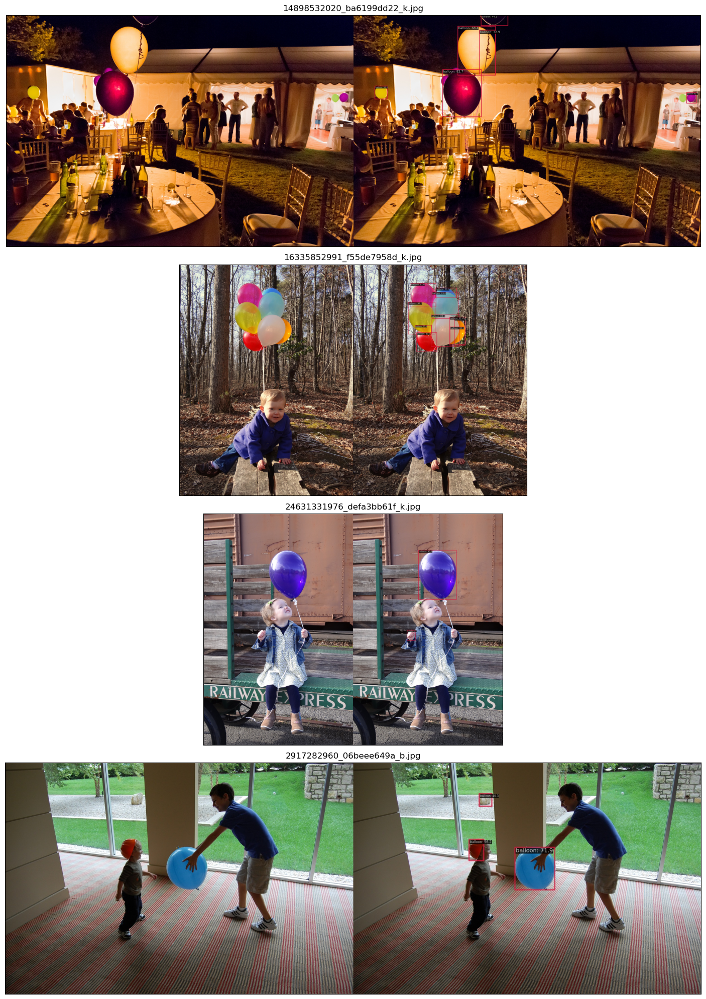

In [5]:
# 数据集可视化

import os
import matplotlib.pyplot as plt
from PIL import Image

%matplotlib inline

plt.figure(figsize=(20, 20))

# 你如果重新跑，这个时间戳是不一样的，需要自己修改
root_path=r'work_dirs\rtmdet_tiny_1xb12-40e_balloon\20230611_223931\results/'
image_paths= [filename for filename in os.listdir(root_path)][:4]

for i,filename in enumerate(image_paths):
    name = os.path.splitext(filename)[0]

    image = Image.open(root_path+filename).convert("RGB")
  
    plt.subplot(4, 1, i+1)
    plt.imshow(image)
    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

In [6]:
!python demo/image_demo.py E:/openmmlab/third/test/11122.jpg rtmdet_tiny_1xb12-40e_balloon.py --weights work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_40.pth

Loads checkpoint by local backend from path: work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_40.pth
06/11 22:45:05 - mmengine - WARNING - Failed to search registry with scope "mmdet" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmdet" is a correct scope, or whether the registry is initialized.
06/11 22:45:05 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.

Inference ----------------------------------------   
Inference ----------------------------------------   
Inference ----------------------------------------   
Inference ----------------------------------------   
Inference ----------------------------------------   
Inference ----------------------------------------   
Inference ----------------------------------------   
Inference -----------------------------

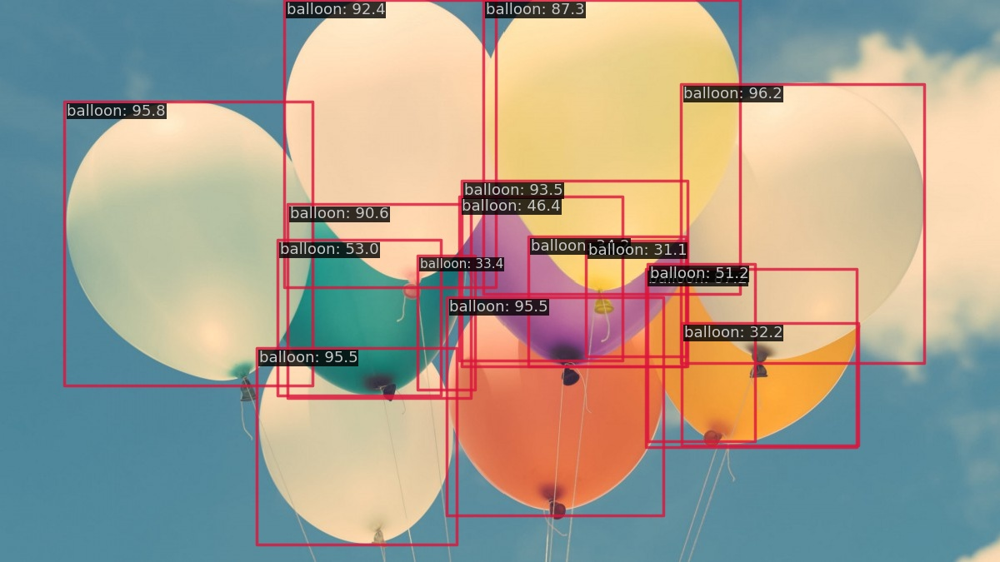

In [8]:
Image.open('outputs/vis/11122.jpg')

# 6 可视化分析

可视化分析包括特征图可视化以及类似 Grad CAM 等可视化分析手段。不过由于 MMDetection 中还没有实现，我们可以直接采用 MMYOLO 中提供的功能和脚本。MMYOLO 是基于 MMDetection 开发，并且此案有了统一的代码组织形式，因此 MMDetection 配置可以直接在 MMYOLO 中使用，无需更改配置。

## MMYOLO 环境和依赖安装

In [11]:
!pwd
%cd E:\openmmlab\third\mmyolo
# !rm -rf mmyolo
# 为了防止后续更新导致的可能无法运行，特意新建了 tutorials 分支
# !git clone -b tutorials https://github.com/open-mmlab/mmyolo.git 
# %cd mmyolo

%pip install -e .
!pwd

E:\openmmlab\third\mmyolo


'pwd' 不是内部或外部命令，也不是可运行的程序
或批处理文件。


Obtaining file:///E:/openmmlab/third/mmyolo
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Running setup.py develop for mmyolo
Note: you may need to restart the kernel to use updated packages.


'pwd' 不是内部或外部命令，也不是可运行的程序
或批处理文件。


In [12]:
import cv2

img = cv2.imread('../test/11122.jpg')
h,w=img.shape[:2]
resized_img = cv2.resize(img, (640, 640))
cv2.imwrite('resized_image.jpg', resized_img)

True

In [20]:
import os
os.getcwd()

'E:\\openmmlab\\third\\mmyolo'

**1. 可视化 backbone 输出的 3 个通道**

Loads checkpoint by local backend from path: ../mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_40.pth
06/11 22:56:36 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
[                                                  ] 0/1, elapsed: 0s, ETA:
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1/1, 0.3 task/s, elapsed: 3s, ETA:     0sAll done!
Results have been saved at E:\openmmlab\third\mmyolo\output


D:\ProgramData\Anaconda3\envs\mmseg\lib\site-packages\torch\functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:2895.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
D:\ProgramData\Anaconda3\envs\mmseg\lib\site-packages\mmengine\visualization\visualizer.py:984: UserWarning: Since the spatial dimensions of overlaid_image: (640, 640) and featmap: torch.Size([80, 80]) are not same, the feature map will be interpolated. This may cause mismatch problems ！
  warnings.warn(
D:\ProgramData\Anaconda3\envs\mmseg\lib\site-packages\mmengine\visualization\visualizer.py:984: UserWarning: Since the spatial dimensions of overlaid_image: (640, 640) and featmap: torch.Size([40, 40]) are not same, the feature map will be interpolated. This may cause mismatch problems ！
  warnings.warn(


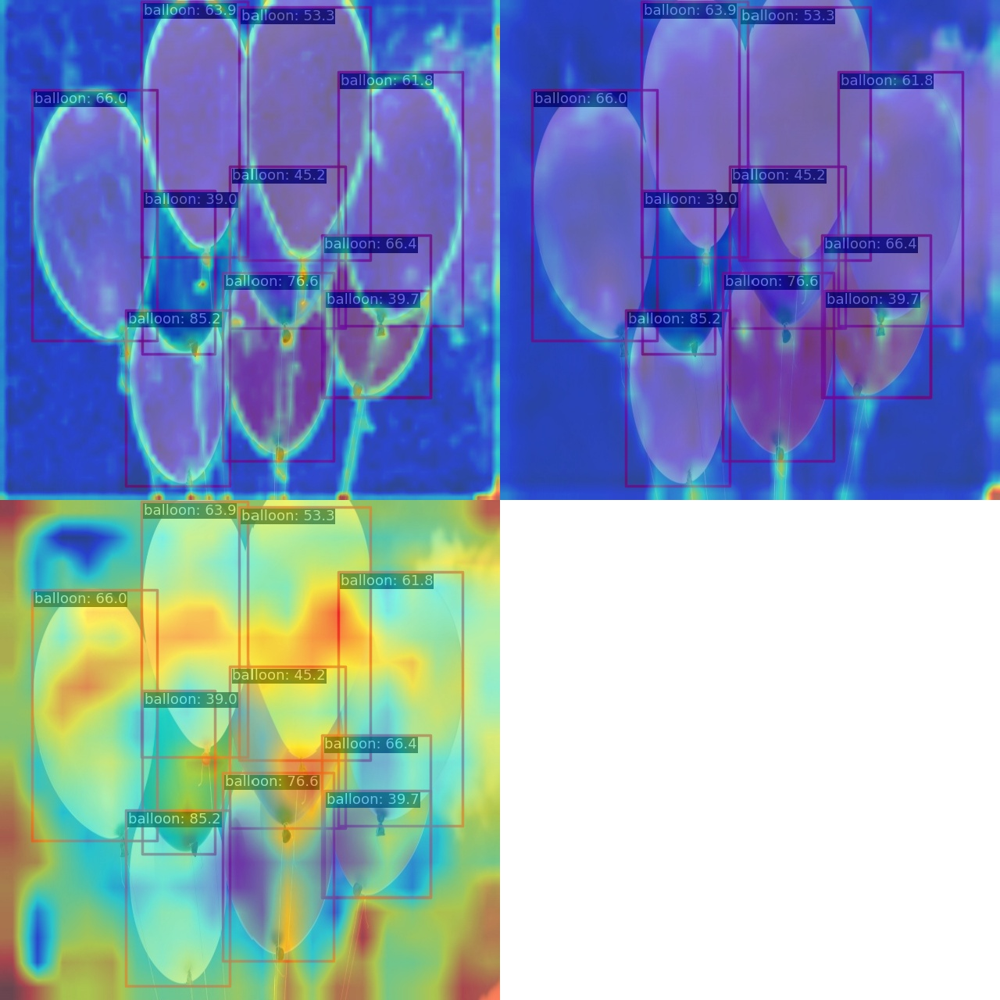

In [22]:
!python demo/featmap_vis_demo.py \
      resized_image.jpg \
      ../mmdetection/rtmdet_tiny_1xb12-40e_balloon.py \
      ../mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_40.pth  \
      --target-layers backbone  \
      --channel-reduction squeeze_mean
Image.open('output/resized_image.jpg')   

上图中绘制的 3 个输出特征图对应大中小输出特征图。由于本次训练的 backbone 实际上没有参与训练，从上图可以看到，大物体 cat 是在小特征图进行预测，这符合目标检测分层检测思想。

**2. 可视化 neck 输出的 3 个通道**

Loads checkpoint by local backend from path: ../mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_40.pth
06/11 22:52:46 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
[                                                  ] 0/1, elapsed: 0s, ETA:
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1/1, 0.4 task/s, elapsed: 3s, ETA:     0sAll done!
Results have been saved at E:\openmmlab\third\mmyolo\output


D:\ProgramData\Anaconda3\envs\mmseg\lib\site-packages\torch\functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:2895.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
D:\ProgramData\Anaconda3\envs\mmseg\lib\site-packages\mmengine\visualization\visualizer.py:984: UserWarning: Since the spatial dimensions of overlaid_image: (640, 640) and featmap: torch.Size([80, 80]) are not same, the feature map will be interpolated. This may cause mismatch problems ！
  warnings.warn(
D:\ProgramData\Anaconda3\envs\mmseg\lib\site-packages\mmengine\visualization\visualizer.py:984: UserWarning: Since the spatial dimensions of overlaid_image: (640, 640) and featmap: torch.Size([40, 40]) are not same, the feature map will be interpolated. This may cause mismatch problems ！
  warnings.warn(


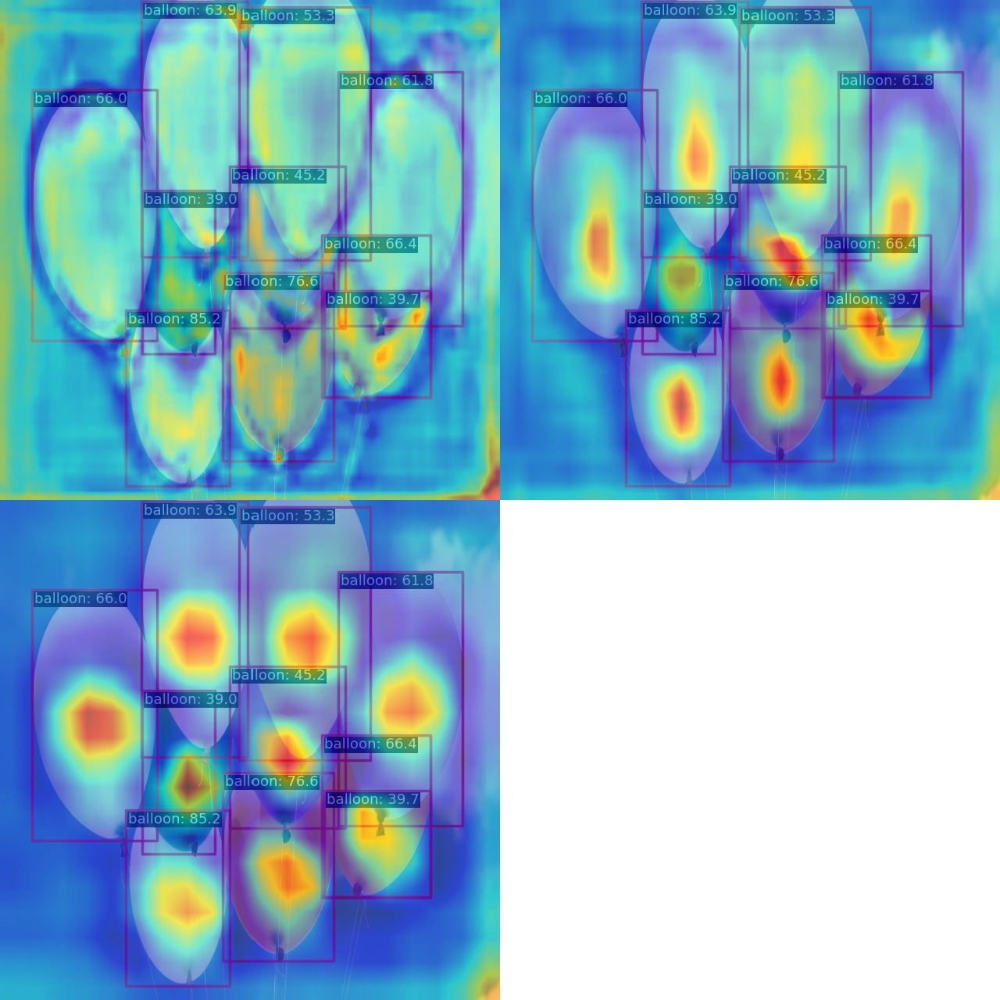

In [17]:
!python demo/featmap_vis_demo.py \
      resized_image.jpg \
      ../mmdetection/rtmdet_tiny_1xb12-40e_balloon.py \
      ../mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_40.pth  \
      --target-layers neck  \
      --channel-reduction squeeze_mean
Image.open('output/neck_Visualization.jpg') 

从上图可以看出，由于 neck 是参与训练的，并且 FPN 间的信息融合导致输出特征图更加聚集

## Grad-Based CAM 可视化

由于目标检测的特殊性，这里实际上可视化的并不是 CAM 而是 Grad Box AM。使用前需要先安装 grad-cam 库


In [18]:
!pip install "grad-cam"

     ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
     ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
     ---------------------------------------- 0.0/7.8 MB 325.1 kB/s eta 0:00:24
     ---------------------------------------- 0.1/7.8 MB 465.5 kB/s eta 0:00:17
      --------------------------------------- 0.1/7.8 MB 717.5 kB/s eta 0:00:11
     - -------------------------------------- 0.2/7.8 MB 1.0 MB/s eta 0:00:08
     - -------------------------------------- 0.3/7.8 MB 1.2 MB/s eta 0:00:07
     -- ------------------------------------- 0.4/7.8 MB 1.3 MB/s eta 0:00:06
     --- ------------------------------------ 0.6/7.8 MB 1.8 MB/s eta 0:00:04
     ---- ----------------------------------- 0.9/7.8 MB 2.3 MB/s eta 0:00:04
     ------- -------------------------------- 1.4/7.8 MB 3.2 MB/s eta 0:00:02
     ---------- ----------------------------- 1.9/7.8 MB 4.0 MB/s eta 0:00:02
     ------------ --------------------------- 2.5/7.8 MB 4.7 MB/s eta 0:

**(a) 查看 neck 输出的最小输出特征图的 Grad CAM**

The algorithm currently used is rtmdet
Loads checkpoint by local backend from path: ../mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_40.pth
[                                                  ] 0/1, elapsed: 0s, ETA:
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1/1, 0.4 task/s, elapsed: 2s, ETA:     0sAll done!
Results have been saved at E:\openmmlab\third\mmyolo\output


D:\ProgramData\Anaconda3\envs\mmseg\lib\site-packages\torch\functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:2895.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


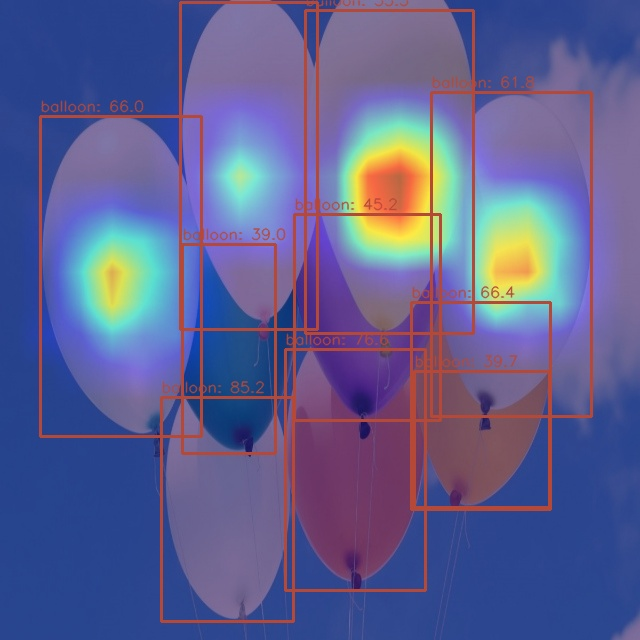

In [23]:
!python demo/boxam_vis_demo.py \
      resized_image.jpg \
      ../mmdetection/rtmdet_tiny_1xb12-40e_balloon.py \
      ../mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_40.pth  \
      --target-layer neck.out_convs[2]
Image.open('output/resized_image.jpg')       

可以看出效果较好

**(b) 查看 neck 输出的最大输出特征图的 Grad CAM**

The algorithm currently used is rtmdet
Loads checkpoint by local backend from path: ../mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_40.pth
[                                                  ] 0/1, elapsed: 0s, ETA:
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1/1, 0.4 task/s, elapsed: 2s, ETA:     0sAll done!
Results have been saved at E:\openmmlab\third\mmyolo\output


D:\ProgramData\Anaconda3\envs\mmseg\lib\site-packages\torch\functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:2895.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


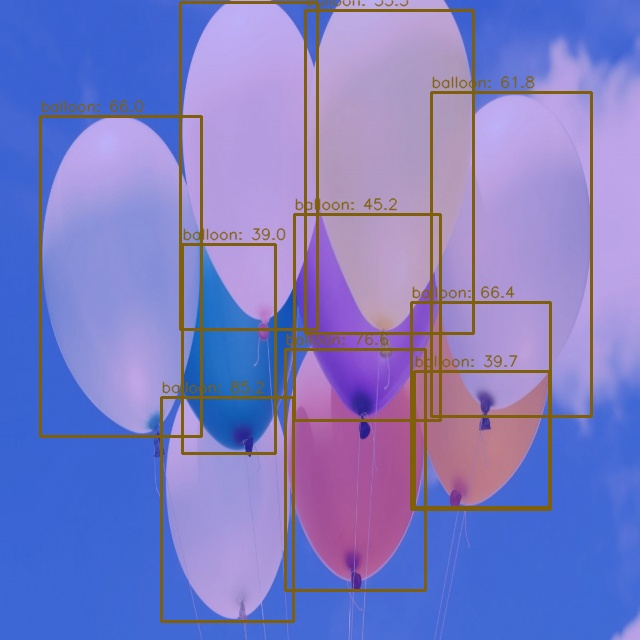

In [24]:
!python demo/boxam_vis_demo.py \
      resized_image.jpg \
      ../mmdetection/rtmdet_tiny_1xb12-40e_balloon.py \
      ../mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_40.pth  \
      --target-layer neck.out_convs[0]
Image.open('output/resized_image.jpg')     